
# Confidence-Weighted Hybrid Denoising for Mixed Gaussian and Salt-and-Pepper Noise Removal

**Author:** Ali Akif Köş  
**Student ID:** 2111041018  
**Course:** Digital Image Processing – Final Term Project

This notebook implements the final experimental pipeline for the project proposal:

1. Download and preprocess the Kodak24 dataset.
2. Generate synthetic mixed Gaussian + salt-and-pepper noise.
3. Apply baseline methods: Adaptive Median Filter (AMF), Non-Local Means (NLM), and BM3D.
4. Apply the proposed confidence-weighted hybrid method.
5. Compute PSNR, SSIM, and average runtime.
6. Export CSV tables, article-ready figures, and a ZIP file for the final report.

> **Recommended workflow:** first set `RUN_MODE = "quick"` to verify the notebook, then set `RUN_MODE = "final"` for the full experiment.


## 1. Install and import libraries

In [ ]:

# Colab installation cell
# bm3d is used as the standard Gaussian-denoising baseline.
!pip -q install bm3d scikit-image tqdm requests pandas

import os
import time
import zipfile
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import requests
from tqdm.auto import tqdm
from IPython.display import display

from skimage import io, color, img_as_float
from skimage.transform import resize
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.restoration import denoise_nl_means

from scipy.ndimage import (
    median_filter,
    uniform_filter,
    minimum_filter,
    maximum_filter,
)

try:
    import bm3d as bm3d_lib
    BM3D_AVAILABLE = True
except Exception as e:
    BM3D_AVAILABLE = False
    BM3D_IMPORT_ERROR = e

print("Libraries loaded.")
print(f"BM3D package available: {BM3D_AVAILABLE}")
if not BM3D_AVAILABLE:
    print("BM3D import error:", BM3D_IMPORT_ERROR)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 862.0/862.0 kB 8.2 MB/s eta 0:00:00
Libraries loaded.
BM3D package available: True


## 2. Experiment configuration

In [ ]:

# -------------------------------------------------------------------------
# Main experiment settings
# -------------------------------------------------------------------------
SEED = 42
np.random.seed(SEED)

# Use "quick" for a short test run and "final" for the complete experiment.
RUN_MODE = "final"   # options: "quick", "final"

# Resize is recommended for Colab runtime stability. Report this in the paper.
RESIZE_IMAGES = True
IMAGE_SIZE = (256, 256) if RESIZE_IMAGES else None

if RUN_MODE == "quick":
    N_EVAL_IMAGES = 5
else:
    N_EVAL_IMAGES = 24

SIGMA_LEVELS = [10, 25]             # Gaussian noise std in 0-255 scale
P_LEVELS = [0.05, 0.10, 0.20]       # Salt-and-pepper noise ratios
K_SELECTED = 1.5                    # Main confidence/detection parameter
K_VALUES = [1.5, 2.0, 2.5, 3.0]     # Ablation study values

IMPULSE_WINDOW = 5
AMF_MAX_WINDOW = 7

ROOT_DIR = "."
DATA_DIR = os.path.join(ROOT_DIR, "kodak24")
RESULTS_DIR = os.path.join(ROOT_DIR, "results")
FIG_DIR = os.path.join(RESULTS_DIR, "figures")
CSV_DIR = os.path.join(RESULTS_DIR, "csv")

os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)
os.makedirs(CSV_DIR, exist_ok=True)

print("Experiment configuration")
print("------------------------")
print(f"RUN_MODE       : {RUN_MODE}")
print(f"N_EVAL_IMAGES  : {N_EVAL_IMAGES}")
print(f"RESIZE_IMAGES  : {RESIZE_IMAGES}")
print(f"IMAGE_SIZE     : {IMAGE_SIZE}")
print(f"SIGMA_LEVELS   : {SIGMA_LEVELS}")
print(f"P_LEVELS       : {P_LEVELS}")
print(f"K_SELECTED     : {K_SELECTED}")


Experiment configuration
------------------------
RUN_MODE       : final
N_EVAL_IMAGES  : 24
RESIZE_IMAGES  : True
IMAGE_SIZE     : (256, 256)
SIGMA_LEVELS   : [10, 25]
P_LEVELS       : [0.05, 0.1, 0.2]
K_SELECTED     : 2.0


## 3. Download and load Kodak24 dataset

Preparing Kodak24 dataset (24 images)...


  0%|          | 0/24 [00:00<?, ?it/s]

Dataset ready: 24/24 images
Loaded images: 24
Example image shape: (256, 256)


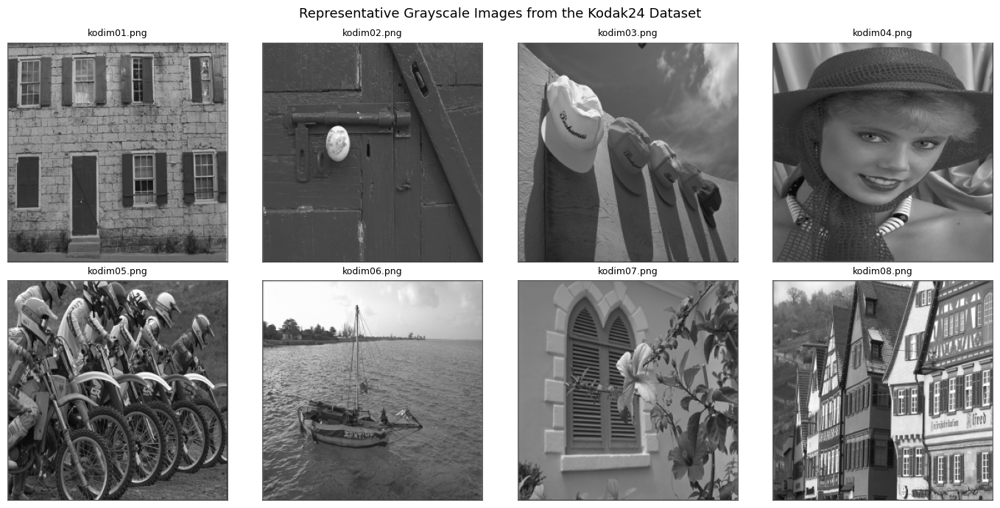

Saved: ./results/figures/kodak24_samples.png


In [ ]:

def download_kodak24(save_dir=DATA_DIR, max_images=24):
    """Download Kodak24 images from the public Kodak dataset mirror."""
    os.makedirs(save_dir, exist_ok=True)
    base_url = "https://r0k.us/graphics/kodak/kodak/"
    downloaded = []

    print(f"Preparing Kodak24 dataset ({max_images} images)...")
    for i in tqdm(range(1, max_images + 1)):
        fname = f"kodim{i:02d}.png"
        fpath = os.path.join(save_dir, fname)

        if os.path.exists(fpath) and os.path.getsize(fpath) > 0:
            downloaded.append(fpath)
            continue

        url = base_url + fname
        try:
            response = requests.get(url, timeout=30)
            response.raise_for_status()
            with open(fpath, "wb") as f:
                f.write(response.content)
            downloaded.append(fpath)
        except Exception as e:
            print(f"Could not download {fname}: {e}")

    if len(downloaded) == 0:
        raise RuntimeError("No Kodak images were downloaded. Check the internet connection in Colab.")

    print(f"Dataset ready: {len(downloaded)}/{max_images} images")
    return downloaded


def load_as_grayscale(paths, resize_to=IMAGE_SIZE):
    """Load images, convert to grayscale, normalize to [0,1], and optionally resize."""
    images = []
    for p in paths:
        img = io.imread(p)
        if img.ndim == 3:
            img = color.rgb2gray(img)
        else:
            img = img_as_float(img)

        img = np.clip(img, 0, 1).astype(np.float32)
        if resize_to is not None:
            img = resize(img, resize_to, anti_aliasing=True, preserve_range=True).astype(np.float32)
            img = np.clip(img, 0, 1)
        images.append(img)
    return images


paths = download_kodak24(max_images=24)
images = load_as_grayscale(paths, resize_to=IMAGE_SIZE)

print(f"Loaded images: {len(images)}")
print(f"Example image shape: {images[0].shape}")

# Save sample dataset figure for the paper.
n_show = min(8, len(images))
fig, axes = plt.subplots(2, 4, figsize=(14, 7))
for ax in axes.ravel():
    ax.axis("off")
for ax, img, p in zip(axes.ravel(), images[:n_show], paths[:n_show]):
    ax.imshow(img, cmap="gray", vmin=0, vmax=1)
    ax.set_title(os.path.basename(p), fontsize=9)

plt.suptitle("Representative Grayscale Images from the Kodak24 Dataset", fontsize=13)
plt.tight_layout()
sample_fig_path = os.path.join(FIG_DIR, "kodak24_samples.png")
plt.savefig(sample_fig_path, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", sample_fig_path)


## 4. Mixed noise generation

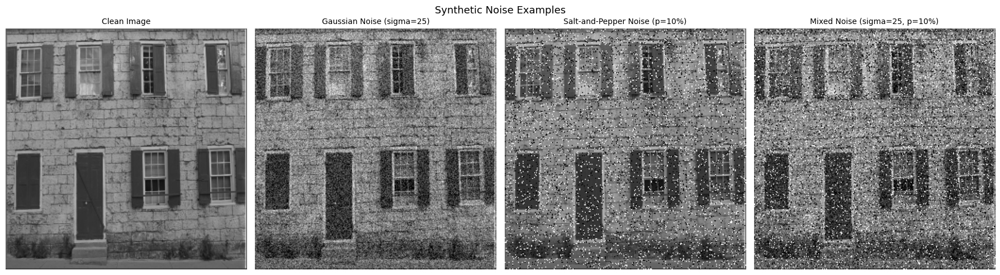

Saved: ./results/figures/noise_types.png


In [ ]:

def add_gaussian_noise(image, sigma):
    """Add zero-mean Gaussian noise. sigma is defined in 0-255 intensity scale."""
    sigma_norm = sigma / 255.0
    noise = np.random.normal(0, sigma_norm, image.shape)
    return np.clip(image + noise, 0, 1).astype(np.float32)


def add_salt_pepper_noise(image, p):
    """Add salt-and-pepper impulse noise with corruption ratio p."""
    noisy = image.copy()
    random_mask = np.random.random(image.shape)
    noisy[random_mask < p / 2] = 0.0
    noisy[random_mask > 1 - p / 2] = 1.0
    return noisy.astype(np.float32)


def add_mixed_noise(image, sigma, p):
    """Add Gaussian noise first, then salt-and-pepper noise."""
    noisy = add_gaussian_noise(image, sigma)
    noisy = add_salt_pepper_noise(noisy, p)
    return np.clip(noisy, 0, 1).astype(np.float32)


# Demonstration figure
np.random.seed(SEED)
test_img = images[0]
sigma_demo = 25
p_demo = 0.10

noisy_gaussian = add_gaussian_noise(test_img, sigma_demo)
noisy_impulse = add_salt_pepper_noise(test_img, p_demo)
noisy_mixed = add_mixed_noise(test_img, sigma_demo, p_demo)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))
plot_items = [
    (test_img, "Clean Image"),
    (noisy_gaussian, f"Gaussian Noise (sigma={sigma_demo})"),
    (noisy_impulse, f"Salt-and-Pepper Noise (p={int(p_demo*100)}%)"),
    (noisy_mixed, f"Mixed Noise (sigma={sigma_demo}, p={int(p_demo*100)}%)"),
]

for ax, (img, title) in zip(axes, plot_items):
    ax.imshow(img, cmap="gray", vmin=0, vmax=1)
    ax.set_title(title, fontsize=10)
    ax.axis("off")

plt.suptitle("Synthetic Noise Examples", fontsize=13)
plt.tight_layout()
noise_fig_path = os.path.join(FIG_DIR, "noise_types.png")
plt.savefig(noise_fig_path, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", noise_fig_path)


## 5. Proposed method: impulse detection, selective repair, and confidence map

Selective repair metrics
Noisy PSNR    : 14.38 dB
Repaired PSNR : 18.60 dB
Noisy SSIM    : 0.2634
Repaired SSIM : 0.4456
Detected pixels: 7.64%


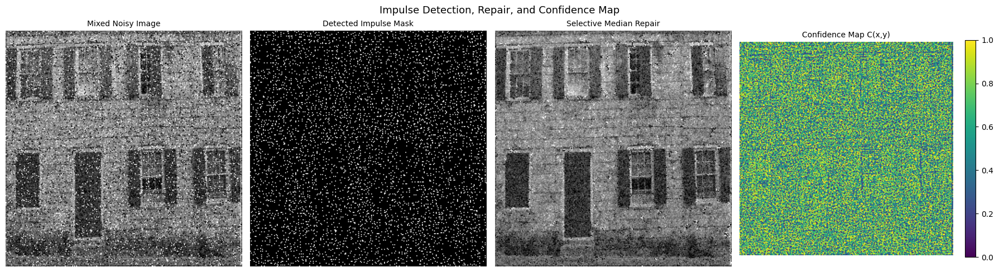

Saved: ./results/figures/impulse_repair_confidence.png


In [ ]:

def detect_impulse_fast(image, k=2.0, window_size=5):
    """
    Adaptive impulse noise detection using local median and local standard deviation.

    A pixel is classified as reliable when:
        |I(x,y) - median(N(x,y))| <= k * sigma_local(x,y)

    Returns:
        mask          : 1 for reliable pixels, 0 for detected impulse pixels
        local_median  : local median image
        local_std     : local standard deviation image
    """
    local_median = median_filter(image, size=window_size, mode="reflect")
    local_mean = uniform_filter(image, size=window_size, mode="reflect")
    local_mean_sq = uniform_filter(image**2, size=window_size, mode="reflect")
    local_std = np.sqrt(np.maximum(local_mean_sq - local_mean**2, 0))

    deviation = np.abs(image - local_median)
    threshold = k * (local_std + 1e-8)
    mask = (deviation <= threshold).astype(np.float32)
    return mask, local_median.astype(np.float32), local_std.astype(np.float32)


def repair_impulse_pixels(image, mask, window_size=5):
    """Replace detected impulse pixels with local median values."""
    local_median = median_filter(image, size=window_size, mode="reflect")
    repaired = image.copy()
    repaired[mask == 0] = local_median[mask == 0]
    return np.clip(repaired, 0, 1).astype(np.float32)


def compute_confidence_map(image, local_median, local_std, eps=1e-6):
    """
    Compute the confidence map:
        C(x,y) = exp(-|I(x,y)-median(N(x,y))| / (sigma_local(x,y)+eps))
    """
    deviation = np.abs(image - local_median)
    confidence = np.exp(-deviation / (local_std + eps))
    return np.clip(confidence, 0, 1).astype(np.float32)


# Demonstration figure
mask_demo, loc_med_demo, loc_std_demo = detect_impulse_fast(
    noisy_mixed, k=K_SELECTED, window_size=IMPULSE_WINDOW
)
repaired_demo = repair_impulse_pixels(noisy_mixed, mask_demo, window_size=IMPULSE_WINDOW)
confidence_demo = compute_confidence_map(noisy_mixed, loc_med_demo, loc_std_demo)

print("Selective repair metrics")
print(f"Noisy PSNR    : {psnr(test_img, noisy_mixed, data_range=1.0):.2f} dB")
print(f"Repaired PSNR : {psnr(test_img, repaired_demo, data_range=1.0):.2f} dB")
print(f"Noisy SSIM    : {ssim(test_img, noisy_mixed, data_range=1.0):.4f}")
print(f"Repaired SSIM : {ssim(test_img, repaired_demo, data_range=1.0):.4f}")
print(f"Detected pixels: {(1 - mask_demo.mean())*100:.2f}%")

fig, axes = plt.subplots(1, 4, figsize=(18, 5))
plot_items = [
    (noisy_mixed, "Mixed Noisy Image", "gray"),
    (1 - mask_demo, "Detected Impulse Mask", "gray"),
    (repaired_demo, "Selective Median Repair", "gray"),
    (confidence_demo, "Confidence Map C(x,y)", "viridis"),
]

for ax, (img, title, cmap) in zip(axes, plot_items):
    im = ax.imshow(img, cmap=cmap, vmin=0, vmax=1)
    ax.set_title(title, fontsize=10)
    ax.axis("off")
    if cmap == "viridis":
        plt.colorbar(im, ax=ax, fraction=0.046)

plt.suptitle("Impulse Detection, Repair, and Confidence Map", fontsize=13)
plt.tight_layout()
impulse_fig_path = os.path.join(FIG_DIR, "impulse_repair_confidence.png")
plt.savefig(impulse_fig_path, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", impulse_fig_path)


## 6. Baseline denoising methods

In [ ]:

def adaptive_median_filter_fast(image, max_window=7):
    """
    Vectorized adaptive median filter approximation based on the Hwang-Haddad logic.
    The window is increased from 3x3 to max_window x max_window.
    """
    output = image.copy()
    remaining = np.ones(image.shape, dtype=bool)
    last_median = median_filter(image, size=max_window, mode="reflect")

    for size in range(3, max_window + 1, 2):
        z_med = median_filter(image, size=size, mode="reflect")
        z_min = minimum_filter(image, size=size, mode="reflect")
        z_max = maximum_filter(image, size=size, mode="reflect")

        stage_a = (z_med > z_min) & (z_med < z_max)
        stage_b = (image > z_min) & (image < z_max)

        current = remaining & stage_a
        replace_with_median = current & (~stage_b)

        output[replace_with_median] = z_med[replace_with_median]
        remaining[current] = False
        last_median = z_med

    if np.any(remaining):
        output[remaining] = last_median[remaining]

    return np.clip(output, 0, 1).astype(np.float32)


def nlm_denoise(image, sigma):
    """Non-Local Means denoising using scikit-image."""
    sigma_norm = sigma / 255.0
    h_param = 0.8 * sigma_norm
    return denoise_nl_means(
        image,
        h=h_param,
        sigma=sigma_norm,
        fast_mode=True,
        patch_size=7,
        patch_distance=11,
        channel_axis=None,
    ).astype(np.float32)


def bm3d_denoise(image, sigma):
    """BM3D denoising using the standard Python bm3d package."""
    if not BM3D_AVAILABLE:
        raise RuntimeError(
            "The bm3d package is not available. Re-run the first installation cell in Colab."
        )
    sigma_norm = sigma / 255.0
    result = bm3d_lib.bm3d(image.astype(np.float32), sigma_psd=sigma_norm)
    return np.clip(result, 0, 1).astype(np.float32)


def compute_metrics(clean, restored):
    """Return PSNR and SSIM for normalized grayscale images."""
    return {
        "PSNR": psnr(clean, restored, data_range=1.0),
        "SSIM": ssim(clean, restored, data_range=1.0),
    }


def timed_call(func, *args, **kwargs):
    """Run a function and return result plus elapsed time in seconds."""
    start = time.perf_counter()
    result = func(*args, **kwargs)
    elapsed = time.perf_counter() - start
    return result, elapsed

print("Baseline functions are ready.")


Baseline functions are ready.


## 7. Proposed confidence-weighted hybrid denoising method

Single-image hybrid result
Noisy    : PSNR=14.42 dB, SSIM=0.2689
Proposed : PSNR=20.85 dB, SSIM=0.5461
Runtime  : 4.412 s


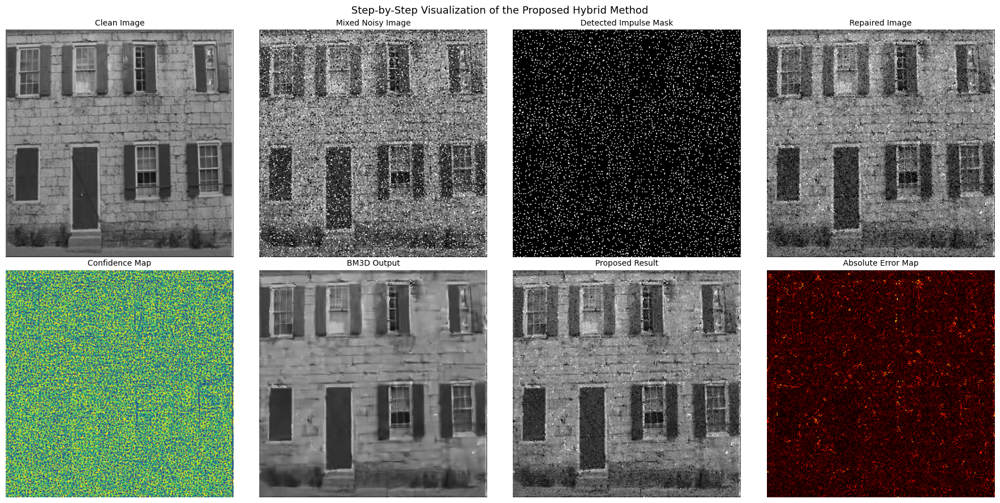

Saved: ./results/figures/hybrid_pipeline_demo.png


In [ ]:

def hybrid_denoise(noisy_image, sigma, k=2.0, window_size=5):
    """
    Proposed hybrid denoising pipeline:
      1. Adaptive impulse detection
      2. Selective median repair
      3. Confidence map computation
      4. BM3D denoising on the repaired image
      5. Confidence-based fusion

    Fusion:
        I_final = C * I_BM3D + (1 - C) * I_repaired
    """
    mask, local_median, local_std = detect_impulse_fast(
        noisy_image, k=k, window_size=window_size
    )
    repaired = repair_impulse_pixels(noisy_image, mask, window_size=window_size)
    confidence = compute_confidence_map(noisy_image, local_median, local_std)
    bm3d_output = bm3d_denoise(repaired, sigma=sigma)
    final = confidence * bm3d_output + (1 - confidence) * repaired

    intermediates = {
        "mask": mask,
        "repaired": repaired,
        "confidence": confidence,
        "bm3d_output": bm3d_output,
    }
    return np.clip(final, 0, 1).astype(np.float32), intermediates


# Single-image demo
np.random.seed(SEED)
demo_noisy = add_mixed_noise(test_img, sigma=sigma_demo, p=p_demo)

demo_hybrid, t_hybrid_demo = timed_call(
    hybrid_denoise,
    demo_noisy,
    sigma_demo,
    K_SELECTED,
    IMPULSE_WINDOW,
)
demo_result, demo_intermediates = demo_hybrid

print("Single-image hybrid result")
print(f"Noisy    : PSNR={psnr(test_img, demo_noisy, data_range=1.0):.2f} dB, SSIM={ssim(test_img, demo_noisy, data_range=1.0):.4f}")
print(f"Proposed : PSNR={psnr(test_img, demo_result, data_range=1.0):.2f} dB, SSIM={ssim(test_img, demo_result, data_range=1.0):.4f}")
print(f"Runtime  : {t_hybrid_demo:.3f} s")

fig, axes = plt.subplots(2, 4, figsize=(18, 9))
plot_items = [
    (test_img, "Clean Image", "gray"),
    (demo_noisy, "Mixed Noisy Image", "gray"),
    (1 - demo_intermediates["mask"], "Detected Impulse Mask", "gray"),
    (demo_intermediates["repaired"], "Repaired Image", "gray"),
    (demo_intermediates["confidence"], "Confidence Map", "viridis"),
    (demo_intermediates["bm3d_output"], "BM3D Output", "gray"),
    (demo_result, "Proposed Result", "gray"),
    (np.abs(test_img - demo_result), "Absolute Error Map", "hot"),
]

for ax, (img, title, cmap) in zip(axes.ravel(), plot_items):
    ax.imshow(img, cmap=cmap, vmin=0, vmax=1)
    ax.set_title(title, fontsize=10)
    ax.axis("off")

plt.suptitle("Step-by-Step Visualization of the Proposed Hybrid Method", fontsize=13)
plt.tight_layout()
pipeline_fig_path = os.path.join(FIG_DIR, "hybrid_pipeline_demo.png")
plt.savefig(pipeline_fig_path, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", pipeline_fig_path)


## 8. Single-image method comparison

,Method,PSNR (dB),SSIM,Runtime (s)
0,Noisy,14.42,0.2689,0.000
1,AMF,21.27,0.5284,0.175
2,NLM,16.91,0.3555,0.274
3,BM3D,17.07,0.3650,4.078
4,Proposed,20.85,0.5461,4.836


Saved: ./results/csv/demo_comparison.csv


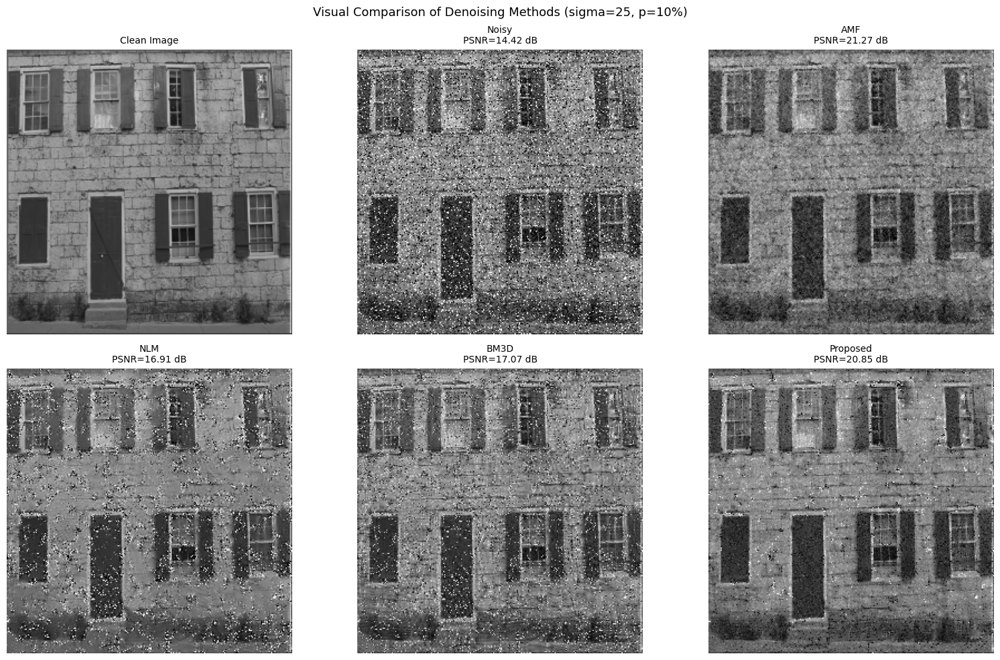

Saved: ./results/figures/method_comparison.png


In [ ]:

# Run all methods on one representative image.
np.random.seed(SEED)
demo_noisy = add_mixed_noise(test_img, sigma=sigma_demo, p=p_demo)

outputs = {}
runtimes = {}

outputs["Noisy"] = demo_noisy
runtimes["Noisy"] = 0.0

outputs["AMF"], runtimes["AMF"] = timed_call(
    adaptive_median_filter_fast, demo_noisy, AMF_MAX_WINDOW
)
outputs["NLM"], runtimes["NLM"] = timed_call(
    nlm_denoise, demo_noisy, sigma_demo
)
outputs["BM3D"], runtimes["BM3D"] = timed_call(
    bm3d_denoise, demo_noisy, sigma_demo
)
hybrid_result_tuple, runtimes["Proposed"] = timed_call(
    hybrid_denoise, demo_noisy, sigma_demo, K_SELECTED, IMPULSE_WINDOW
)
outputs["Proposed"], _ = hybrid_result_tuple

comparison_rows = []
for method, restored in outputs.items():
    metric = compute_metrics(test_img, restored)
    comparison_rows.append({
        "Method": method,
        "PSNR (dB)": metric["PSNR"],
        "SSIM": metric["SSIM"],
        "Runtime (s)": runtimes[method],
    })

df_demo = pd.DataFrame(comparison_rows)
display(df_demo.round({"PSNR (dB)": 2, "SSIM": 4, "Runtime (s)": 3}))
demo_csv_path = os.path.join(CSV_DIR, "demo_comparison.csv")
df_demo.to_csv(demo_csv_path, index=False)
print("Saved:", demo_csv_path)

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
visual_items = [
    (test_img, "Clean Image"),
    (outputs["Noisy"], f"Noisy\nPSNR={psnr(test_img, outputs['Noisy'], data_range=1.0):.2f} dB"),
    (outputs["AMF"], f"AMF\nPSNR={psnr(test_img, outputs['AMF'], data_range=1.0):.2f} dB"),
    (outputs["NLM"], f"NLM\nPSNR={psnr(test_img, outputs['NLM'], data_range=1.0):.2f} dB"),
    (outputs["BM3D"], f"BM3D\nPSNR={psnr(test_img, outputs['BM3D'], data_range=1.0):.2f} dB"),
    (outputs["Proposed"], f"Proposed\nPSNR={psnr(test_img, outputs['Proposed'], data_range=1.0):.2f} dB"),
]

for ax, (img, title) in zip(axes.ravel(), visual_items):
    ax.imshow(img, cmap="gray", vmin=0, vmax=1)
    ax.set_title(title, fontsize=10)
    ax.axis("off")

plt.suptitle(f"Visual Comparison of Denoising Methods (sigma={sigma_demo}, p={int(p_demo*100)}%)", fontsize=13)
plt.tight_layout()
method_fig_path = os.path.join(FIG_DIR, "method_comparison.png")
plt.savefig(method_fig_path, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", method_fig_path)


## 9. Full dataset evaluation with PSNR, SSIM, and runtime

In [ ]:

def evaluate_one_case(clean_image, sigma, p):
    """Evaluate all methods on one clean image under a given mixed-noise condition."""
    noisy = add_mixed_noise(clean_image, sigma=sigma, p=p)

    method_outputs = {"Noisy": noisy}
    method_times = {"Noisy": 0.0}

    method_outputs["AMF"], method_times["AMF"] = timed_call(
        adaptive_median_filter_fast, noisy, AMF_MAX_WINDOW
    )
    method_outputs["NLM"], method_times["NLM"] = timed_call(
        nlm_denoise, noisy, sigma
    )
    method_outputs["BM3D"], method_times["BM3D"] = timed_call(
        bm3d_denoise, noisy, sigma
    )
    hybrid_tuple, method_times["Proposed"] = timed_call(
        hybrid_denoise, noisy, sigma, K_SELECTED, IMPULSE_WINDOW
    )
    method_outputs["Proposed"], _ = hybrid_tuple

    rows = []
    for method, restored in method_outputs.items():
        metric = compute_metrics(clean_image, restored)
        rows.append({
            "method": method,
            "PSNR": metric["PSNR"],
            "SSIM": metric["SSIM"],
            "runtime_s": method_times[method],
        })
    return rows


np.random.seed(SEED)
eval_images = images[:N_EVAL_IMAGES]
eval_paths = paths[:N_EVAL_IMAGES]

records = []
total_cases = len(eval_images) * len(SIGMA_LEVELS) * len(P_LEVELS)
case_idx = 0

start_all = time.perf_counter()
for sigma in SIGMA_LEVELS:
    for p in P_LEVELS:
        for img_idx, (clean_img, img_path) in enumerate(zip(eval_images, eval_paths), start=1):
            case_idx += 1
            print(f"[{case_idx:03d}/{total_cases:03d}] {os.path.basename(img_path)} | sigma={sigma} | p={int(p*100)}%")
            rows = evaluate_one_case(clean_img, sigma=sigma, p=p)
            for row in rows:
                row.update({
                    "image_index": img_idx,
                    "image_name": os.path.basename(img_path),
                    "sigma": sigma,
                    "p": p,
                    "p_pct": int(p * 100),
                    "run_mode": RUN_MODE,
                    "resize_images": RESIZE_IMAGES,
                    "image_size": str(IMAGE_SIZE),
                    "k": K_SELECTED,
                })
                records.append(row)

elapsed_all = time.perf_counter() - start_all
print(f"Full evaluation completed in {elapsed_all/60:.2f} minutes.")

df_per_image = pd.DataFrame(records)
per_image_csv = os.path.join(CSV_DIR, "per_image_results.csv")
df_per_image.to_csv(per_image_csv, index=False)
print("Saved:", per_image_csv)

# Long summary table
summary_long = (
    df_per_image
    .groupby(["sigma", "p_pct", "method"], as_index=False)
    .agg(
        PSNR_mean=("PSNR", "mean"),
        PSNR_std=("PSNR", "std"),
        SSIM_mean=("SSIM", "mean"),
        SSIM_std=("SSIM", "std"),
        Runtime_mean_s=("runtime_s", "mean"),
        Runtime_std_s=("runtime_s", "std"),
    )
)
summary_long_csv = os.path.join(CSV_DIR, "summary_results_long.csv")
summary_long.to_csv(summary_long_csv, index=False)
print("Saved:", summary_long_csv)

# Wide summary table for easier paper table formatting
wide = summary_long.pivot(index=["sigma", "p_pct"], columns="method")
wide.columns = [f"{metric}_{method}" for metric, method in wide.columns]
wide = wide.reset_index()
wide_csv = os.path.join(CSV_DIR, "full_results.csv")
wide.to_csv(wide_csv, index=False)
print("Saved:", wide_csv)

print("\nAverage results by noise condition and method:")
display(summary_long.round({
    "PSNR_mean": 2,
    "PSNR_std": 2,
    "SSIM_mean": 4,
    "SSIM_std": 4,
    "Runtime_mean_s": 3,
    "Runtime_std_s": 3,
}))


[001/144] kodim01.png | sigma=10 | p=5%
[002/144] kodim02.png | sigma=10 | p=5%
[003/144] kodim03.png | sigma=10 | p=5%
[004/144] kodim04.png | sigma=10 | p=5%
[005/144] kodim05.png | sigma=10 | p=5%
[006/144] kodim06.png | sigma=10 | p=5%
[007/144] kodim07.png | sigma=10 | p=5%
[008/144] kodim08.png | sigma=10 | p=5%
[009/144] kodim09.png | sigma=10 | p=5%
[010/144] kodim10.png | sigma=10 | p=5%
[011/144] kodim11.png | sigma=10 | p=5%
[012/144] kodim12.png | sigma=10 | p=5%
[013/144] kodim13.png | sigma=10 | p=5%
[014/144] kodim14.png | sigma=10 | p=5%
[015/144] kodim15.png | sigma=10 | p=5%
[016/144] kodim16.png | sigma=10 | p=5%
[017/144] kodim17.png | sigma=10 | p=5%
[018/144] kodim18.png | sigma=10 | p=5%
[019/144] kodim19.png | sigma=10 | p=5%
[020/144] kodim20.png | sigma=10 | p=5%
[021/144] kodim21.png | sigma=10 | p=5%
[022/144] kodim22.png | sigma=10 | p=5%
[023/144] kodim23.png | sigma=10 | p=5%
[024/144] kodim24.png | sigma=10 | p=5%
[025/144] kodim01.png | sigma=10 | p=10%

,sigma,p_pct,method,PSNR_mean,PSNR_std,SSIM_mean,SSIM_std,Runtime_mean_s,Runtime_std_s
0,10,5,AMF,28.45,1.16,0.7399,0.0553,0.185,0.020
1,10,5,BM3D,18.40,0.42,0.3945,0.0860,4.565,0.683
2,10,5,NLM,18.02,0.35,0.3743,0.0869,0.234,0.064
3,10,5,Noisy,17.85,0.33,0.3482,0.0976,0.000,0.000
4,10,5,Proposed,28.19,1.40,0.7875,0.0492,4.964,0.631
5,10,10,AMF,28.03,1.14,0.7273,0.0589,0.190,0.023
6,10,10,BM3D,15.27,0.42,0.2320,0.0820,4.425,0.616
7,10,10,NLM,15.08,0.39,0.2264,0.0813,0.201,0.035
8,10,10,Noisy,15.06,0.40,0.2235,0.0825,0.000,0.000
9,10,10,Proposed,24.72,1.14,0.6871,0.0752,5.056,0.768


## 10. Article-ready plots

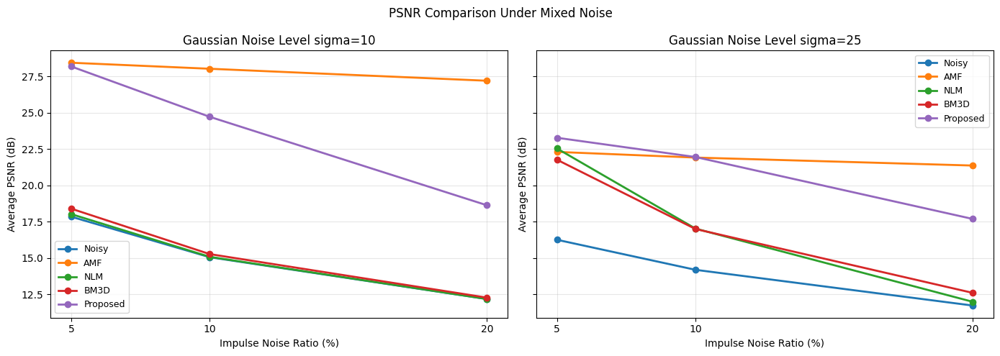

Saved: ./results/figures/psnr_comparison.png


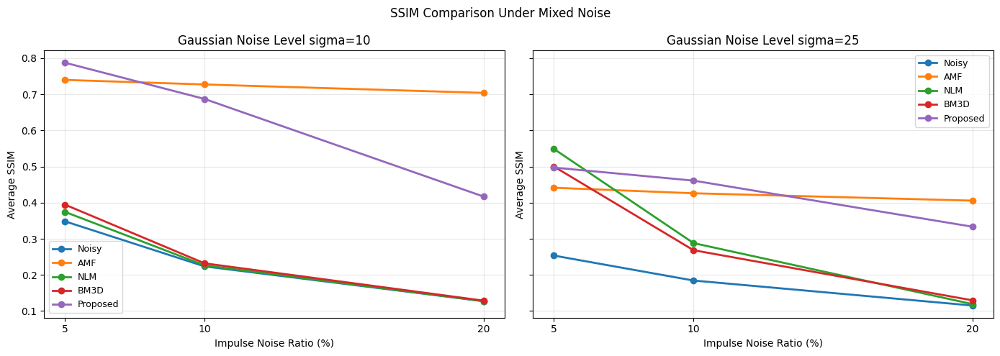

Saved: ./results/figures/ssim_comparison.png


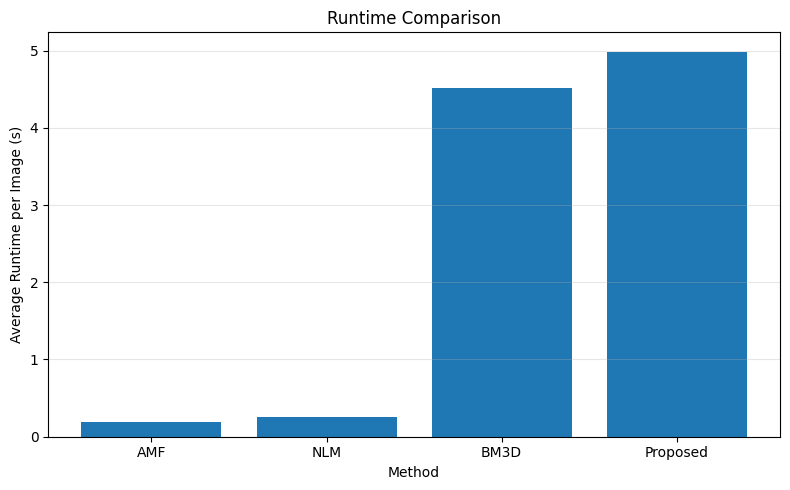

Saved: ./results/figures/runtime_comparison.png


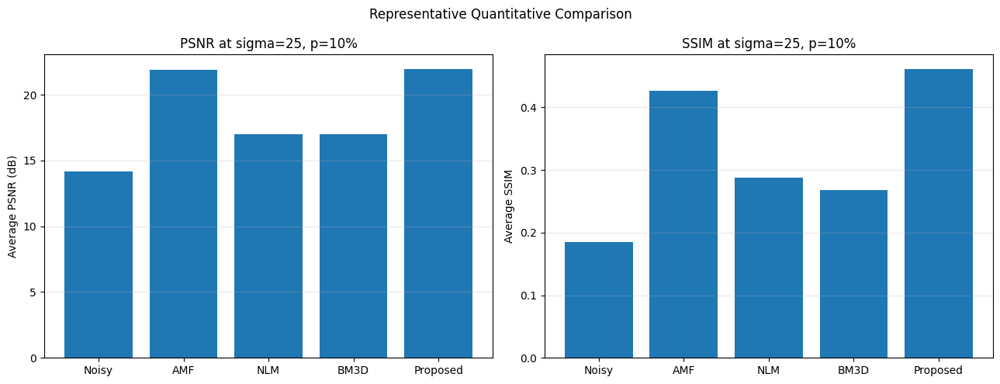

Saved: ./results/figures/bar_comparison_sigma25_p10.png


In [ ]:

methods_order = ["Noisy", "AMF", "NLM", "BM3D", "Proposed"]

# PSNR vs impulse ratio
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)
for ax, sigma in zip(axes, SIGMA_LEVELS):
    sub = summary_long[summary_long["sigma"] == sigma]
    for method in methods_order:
        msub = sub[sub["method"] == method].sort_values("p_pct")
        ax.plot(msub["p_pct"], msub["PSNR_mean"], marker="o", linewidth=2, label=method)
    ax.set_title(f"Gaussian Noise Level sigma={sigma}")
    ax.set_xlabel("Impulse Noise Ratio (%)")
    ax.set_ylabel("Average PSNR (dB)")
    ax.grid(True, alpha=0.3)
    ax.set_xticks([5, 10, 20])
    ax.legend(fontsize=9)
plt.suptitle("PSNR Comparison Under Mixed Noise")
plt.tight_layout()
psnr_fig = os.path.join(FIG_DIR, "psnr_comparison.png")
plt.savefig(psnr_fig, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", psnr_fig)

# SSIM vs impulse ratio
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)
for ax, sigma in zip(axes, SIGMA_LEVELS):
    sub = summary_long[summary_long["sigma"] == sigma]
    for method in methods_order:
        msub = sub[sub["method"] == method].sort_values("p_pct")
        ax.plot(msub["p_pct"], msub["SSIM_mean"], marker="o", linewidth=2, label=method)
    ax.set_title(f"Gaussian Noise Level sigma={sigma}")
    ax.set_xlabel("Impulse Noise Ratio (%)")
    ax.set_ylabel("Average SSIM")
    ax.grid(True, alpha=0.3)
    ax.set_xticks([5, 10, 20])
    ax.legend(fontsize=9)
plt.suptitle("SSIM Comparison Under Mixed Noise")
plt.tight_layout()
ssim_fig = os.path.join(FIG_DIR, "ssim_comparison.png")
plt.savefig(ssim_fig, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", ssim_fig)

# Runtime comparison
runtime_df = (
    summary_long[summary_long["method"].isin(["AMF", "NLM", "BM3D", "Proposed"])]
    .groupby("method", as_index=False)["Runtime_mean_s"]
    .mean()
)
runtime_df["method"] = pd.Categorical(runtime_df["method"], categories=["AMF", "NLM", "BM3D", "Proposed"], ordered=True)
runtime_df = runtime_df.sort_values("method")

fig, ax = plt.subplots(figsize=(8, 5))
ax.bar(runtime_df["method"].astype(str), runtime_df["Runtime_mean_s"])
ax.set_xlabel("Method")
ax.set_ylabel("Average Runtime per Image (s)")
ax.set_title("Runtime Comparison")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
runtime_fig = os.path.join(FIG_DIR, "runtime_comparison.png")
plt.savefig(runtime_fig, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", runtime_fig)

# Bar chart for one representative condition: sigma=25, p=10%
condition_df = summary_long[(summary_long["sigma"] == 25) & (summary_long["p_pct"] == 10)].copy()
condition_df["method"] = pd.Categorical(condition_df["method"], categories=methods_order, ordered=True)
condition_df = condition_df.sort_values("method")

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
axes[0].bar(condition_df["method"].astype(str), condition_df["PSNR_mean"])
axes[0].set_title("PSNR at sigma=25, p=10%")
axes[0].set_ylabel("Average PSNR (dB)")
axes[0].grid(axis="y", alpha=0.3)

axes[1].bar(condition_df["method"].astype(str), condition_df["SSIM_mean"])
axes[1].set_title("SSIM at sigma=25, p=10%")
axes[1].set_ylabel("Average SSIM")
axes[1].grid(axis="y", alpha=0.3)

plt.suptitle("Representative Quantitative Comparison")
plt.tight_layout()
bar_fig = os.path.join(FIG_DIR, "bar_comparison_sigma25_p10.png")
plt.savefig(bar_fig, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", bar_fig)


## 11. Ablation study: effect of k

Saved: ./results/csv/ablation_k.csv


,k,Detected pixels (%),PSNR (dB),SSIM,Runtime (s)
0,1.5,11.75,22.96,0.6026,4.507
1,2.0,7.49,20.85,0.5461,5.841
2,2.5,3.89,17.91,0.4304,4.380
3,3.0,1.67,16.19,0.3503,4.914


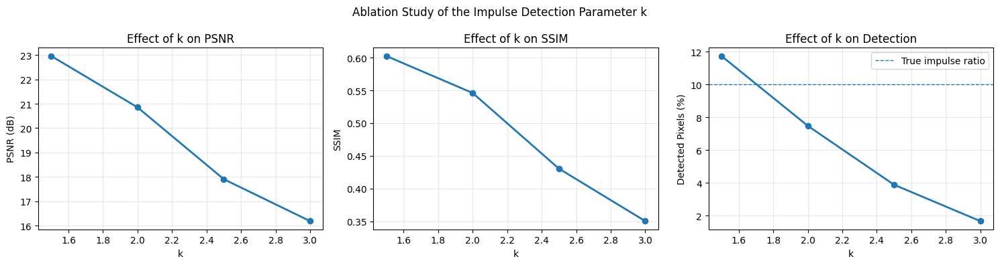

Saved: ./results/figures/ablation_k.png


In [ ]:

# k ablation on a representative case.
np.random.seed(SEED)
ablation_img = images[0]
ablation_noisy = add_mixed_noise(ablation_img, sigma=25, p=0.10)

ablation_rows = []
for k_val in K_VALUES:
    result_tuple, runtime_k = timed_call(
        hybrid_denoise, ablation_noisy, 25, k_val, IMPULSE_WINDOW
    )
    result_k, intermediates_k = result_tuple
    metric = compute_metrics(ablation_img, result_k)
    detected_pct = (1 - intermediates_k["mask"].mean()) * 100
    ablation_rows.append({
        "k": k_val,
        "Detected pixels (%)": detected_pct,
        "PSNR (dB)": metric["PSNR"],
        "SSIM": metric["SSIM"],
        "Runtime (s)": runtime_k,
    })

df_ablation_k = pd.DataFrame(ablation_rows)
ablation_k_csv = os.path.join(CSV_DIR, "ablation_k.csv")
df_ablation_k.to_csv(ablation_k_csv, index=False)
print("Saved:", ablation_k_csv)
display(df_ablation_k.round({"Detected pixels (%)": 2, "PSNR (dB)": 2, "SSIM": 4, "Runtime (s)": 3}))

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].plot(df_ablation_k["k"], df_ablation_k["PSNR (dB)"], marker="o", linewidth=2)
axes[0].set_xlabel("k")
axes[0].set_ylabel("PSNR (dB)")
axes[0].set_title("Effect of k on PSNR")
axes[0].grid(True, alpha=0.3)

axes[1].plot(df_ablation_k["k"], df_ablation_k["SSIM"], marker="o", linewidth=2)
axes[1].set_xlabel("k")
axes[1].set_ylabel("SSIM")
axes[1].set_title("Effect of k on SSIM")
axes[1].grid(True, alpha=0.3)

axes[2].plot(df_ablation_k["k"], df_ablation_k["Detected pixels (%)"], marker="o", linewidth=2)
axes[2].axhline(10, linestyle="--", linewidth=1, label="True impulse ratio")
axes[2].set_xlabel("k")
axes[2].set_ylabel("Detected Pixels (%)")
axes[2].set_title("Effect of k on Detection")
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.suptitle("Ablation Study of the Impulse Detection Parameter k")
plt.tight_layout()
ablation_k_fig = os.path.join(FIG_DIR, "ablation_k.png")
plt.savefig(ablation_k_fig, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", ablation_k_fig)


## 12. Ablation study: contribution of pipeline components

Saved: ./results/csv/ablation_components.csv


,Variant,PSNR (dB),SSIM,Runtime (s)
0,BM3D only,17.07,0.3650,3.971
1,Repair + BM3D,25.12,0.7111,5.766
2,Repair + BM3D + Confidence Fusion,20.85,0.5461,4.399


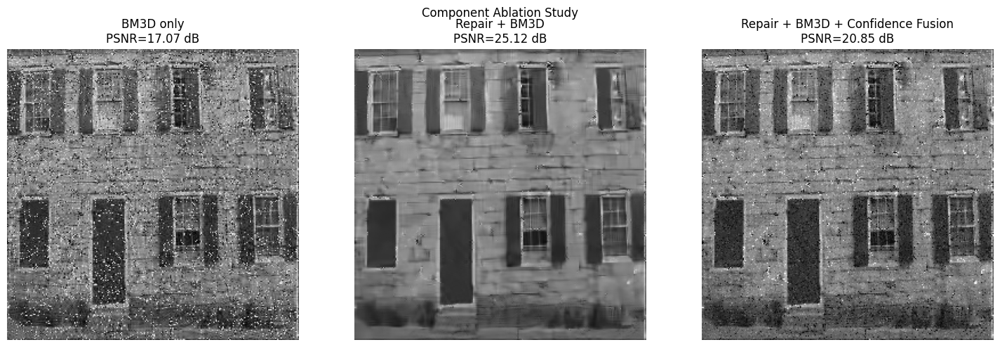

Saved: ./results/figures/ablation_components.png


In [ ]:

# Component ablation at sigma=25, p=10%.
np.random.seed(SEED)
component_clean = images[0]
component_noisy = add_mixed_noise(component_clean, sigma=25, p=0.10)

# Variant 1: BM3D directly on mixed noisy image
bm3d_only, t_bm3d_only = timed_call(bm3d_denoise, component_noisy, 25)

# Variant 2: repair + BM3D, no fusion
mask_c, lm_c, ls_c = detect_impulse_fast(component_noisy, k=K_SELECTED, window_size=IMPULSE_WINDOW)
repaired_c = repair_impulse_pixels(component_noisy, mask_c, window_size=IMPULSE_WINDOW)
repair_bm3d, t_repair_bm3d = timed_call(bm3d_denoise, repaired_c, 25)

# Variant 3: full proposed method
full_tuple, t_full = timed_call(hybrid_denoise, component_noisy, 25, K_SELECTED, IMPULSE_WINDOW)
full_hybrid, full_intermediates = full_tuple

component_variants = [
    ("BM3D only", bm3d_only, t_bm3d_only),
    ("Repair + BM3D", repair_bm3d, t_repair_bm3d),
    ("Repair + BM3D + Confidence Fusion", full_hybrid, t_full),
]

component_rows = []
for name, result, runtime_val in component_variants:
    metric = compute_metrics(component_clean, result)
    component_rows.append({
        "Variant": name,
        "PSNR (dB)": metric["PSNR"],
        "SSIM": metric["SSIM"],
        "Runtime (s)": runtime_val,
    })

df_components = pd.DataFrame(component_rows)
components_csv = os.path.join(CSV_DIR, "ablation_components.csv")
df_components.to_csv(components_csv, index=False)
print("Saved:", components_csv)
display(df_components.round({"PSNR (dB)": 2, "SSIM": 4, "Runtime (s)": 3}))

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, (name, result, _) in zip(axes, component_variants):
    ax.imshow(result, cmap="gray", vmin=0, vmax=1)
    metric = compute_metrics(component_clean, result)
    ax.set_title(f"{name}\nPSNR={metric['PSNR']:.2f} dB")
    ax.axis("off")
plt.suptitle("Component Ablation Study")
plt.tight_layout()
components_fig = os.path.join(FIG_DIR, "ablation_components.png")
plt.savefig(components_fig, dpi=200, bbox_inches="tight")
plt.show()
print("Saved:", components_fig)


## 13. Export results and create GitHub README

In [ ]:

# README.md content for the GitHub repository.
readme_text = f"""# Confidence-Weighted Hybrid Denoising for Mixed Gaussian and Salt-and-Pepper Noise Removal

Author: Ali Akif Köş
Student ID: 2111041018
Course: Digital Image Processing – Final Term Project

## Project Summary

This project evaluates a confidence-weighted hybrid image denoising pipeline for images corrupted by mixed Gaussian and salt-and-pepper impulse noise. The proposed method detects impulse-corrupted pixels, repairs them using local median statistics, applies BM3D for Gaussian noise reduction, and fuses the repaired and BM3D-denoised outputs using a spatial confidence map.

## Dataset

The experiments use the Kodak24 dataset. Images are converted to grayscale. In this notebook, `RESIZE_IMAGES={RESIZE_IMAGES}` and `IMAGE_SIZE={IMAGE_SIZE}`.

## Noise Settings

- Gaussian noise levels: {SIGMA_LEVELS}
- Salt-and-pepper noise ratios: {[int(p*100) for p in P_LEVELS]}%
- Main impulse detection parameter: k={K_SELECTED}

## Compared Methods

- Noisy image
- Adaptive Median Filter (AMF)
- Non-Local Means (NLM)
- BM3D
- Proposed confidence-weighted hybrid method

## Evaluation Metrics

- PSNR
- SSIM
- Average runtime per image

## How to Run

1. Open the notebook in Google Colab.
2. Run all cells in order.
3. Use `RUN_MODE=\"quick\"` for a short test or `RUN_MODE=\"final\"` for the full experiment.
4. Results are saved under the `results/` directory.
5. The final ZIP file contains CSV tables and article-ready figures.

## Output Files

- `results/csv/per_image_results.csv`
- `results/csv/summary_results_long.csv`
- `results/csv/full_results.csv`
- `results/csv/ablation_k.csv`
- `results/csv/ablation_components.csv`
- `results/figures/*.png`

## References

- K. Dabov, A. Foi, V. Katkovnik, and K. Egiazarian, "Image denoising by sparse 3-D transform-domain collaborative filtering," IEEE Transactions on Image Processing, 2007.
- H. Hwang and R. A. Haddad, "Adaptive median filters: new algorithms and results," IEEE Transactions on Image Processing, 1995.
"""

readme_path = os.path.join(ROOT_DIR, "README.md")
with open(readme_path, "w", encoding="utf-8") as f:
    f.write(readme_text)
print("Saved:", readme_path)

# Zip all outputs.
zip_path = os.path.join(ROOT_DIR, "hybrid_denoising_final_outputs.zip")
with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zf:
    if os.path.exists(readme_path):
        zf.write(readme_path, arcname="README.md")
    for folder in [CSV_DIR, FIG_DIR]:
        for root, _, files in os.walk(folder):
            for file in files:
                fpath = os.path.join(root, file)
                arcname = os.path.relpath(fpath, ROOT_DIR)
                zf.write(fpath, arcname=arcname)

print("Created ZIP:", zip_path)
print("In Colab: open the left Files panel, right-click hybrid_denoising_final_outputs.zip, and download it.")

print("\nFinal run summary")
print("-----------------")
print(f"Run mode: {RUN_MODE}")
print(f"Images evaluated: {N_EVAL_IMAGES}")
print(f"Noise configurations: {len(SIGMA_LEVELS)} x {len(P_LEVELS)} = {len(SIGMA_LEVELS)*len(P_LEVELS)}")
print("Methods: Noisy, AMF, NLM, BM3D, Proposed")
print("Metrics: PSNR, SSIM, Runtime")


Saved: ./README.md
Created ZIP: ./hybrid_denoising_final_outputs.zip
In Colab: open the left Files panel, right-click hybrid_denoising_final_outputs.zip, and download it.

Final run summary
-----------------
Run mode: final
Images evaluated: 24
Noise configurations: 2 x 3 = 6
Methods: Noisy, AMF, NLM, BM3D, Proposed
Metrics: PSNR, SSIM, Runtime
